In [1]:
import cv2, os, imageio
import numpy as np
from keras.models import Model
from keras.layers import Input, merge, concatenate, Convolution2D, Conv2D, MaxPooling2D, UpSampling2D, Dropout,Conv2DTranspose, LeakyReLU, PReLU, ReLU
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
from keras.layers import Layer, Lambda
from keras import losses
import tensorflow as tf
import glob
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.initializers import Constant
import scipy.ndimage as ndi
#from data import load_train_data, load_test_data
from numpy import random
from skimage.transform import rotate, resize
from skimage import data
import matplotlib.pyplot as plt
import cv2


img_rows = 1024
img_cols = 1024
img_channel = 3
smooth = 1

input_shape = (img_rows, img_cols)



Using TensorFlow backend.


In [2]:
def plot_output(data):

    plt.figure(figsize=(15,8))
    for i in range(8):
        plt.subplot(2, 4, i+1)
        plt.imshow(data[i])
        #plt.colorbar()#, cmap='gray'
        plt.axis('off')
    
    # tight_layout minimizes the overlap between 2 sub-plots
    plt.tight_layout()

## Overview over the dataset

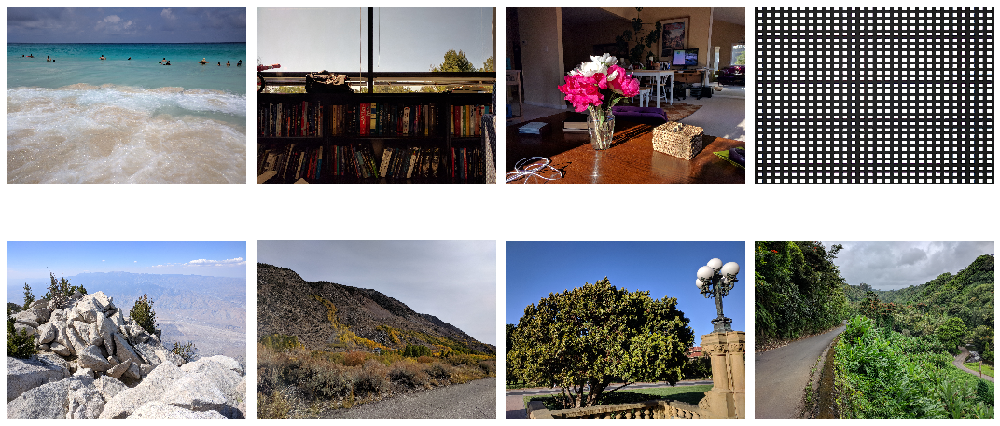

In [3]:
data_dir="/mnt/data-drive/data/hdr_dataset_google/"
file_paths =[]
for filename in glob.iglob(data_dir+'//**/*'+".jpg", recursive=True):
    file_paths.append(filename)
    
images = []
for file in random.choice(file_paths, 8):
    full_img = imageio.imread(file)
    full_img = full_img/255
    images.append(full_img)
    
plot_output(images)
        
        

## Define LE-Grid

In [6]:
def get_mask(shape, steps=10, middle_offset=0, rotate_45 = False):
        
    if rotate_45:
        # Generates the 45 degree rotated grid
        steps = np.round(np.sqrt((np.square(steps)/2))).astype(int)
        middle_offset = np.round(np.sqrt((np.square(middle_offset)/2))).astype(int)
        mask = np.zeros(shape)
        steps=steps*2
        offset = np.round(steps/2).astype(int)
        mask[::steps, ::steps] = 1
        mask[offset::steps, offset::steps] = 1
    else:
        # Generates the normal grid
        mask = np.zeros(shape)
        mask[::steps, ::steps] = 1
    
    if (middle_offset != 0):
        # Test with 2% of the pixels augmentated
        mask[middle_offset::steps, middle_offset::steps] = 1
        
    return mask

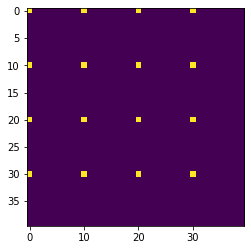

{0.0: 1037967, 1.0: 10609}
Total Numer of Pixels: 1048576
Number of ND-Pixels: 10609
Percentage of ND-Pixels: 1.011753%


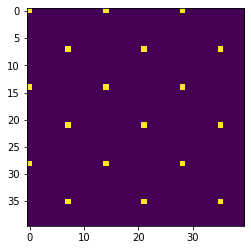

{0.0: 1037771, 1.0: 10805}
Total Numer of Pixels: 1048576
Number of ND-Pixels: 10805
Percentage of ND-Pixels: 1.030445%


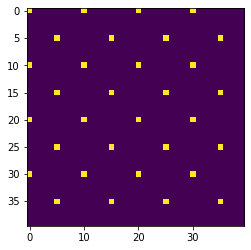

{0.0: 1027563, 1.0: 21013}
Total Numer of Pixels: 1048576
Number of ND-Pixels: 21013
Percentage of ND-Pixels: 2.003956%


In [5]:
grid = get_mask((57,57))
grid_sizesdisp=(1024,1024)

# Show normal grid and evaluate
org_grid = get_mask(grid_sizesdisp)
plt.imshow(org_grid[0:40,0:40])
plt.show()

unique, counts = np.unique(org_grid, return_counts=True)
unique_counts =dict(zip(unique, counts))
print(unique_counts)
percentage = (unique_counts[1.0]/(unique_counts[1.0]+unique_counts[0.0]))*100
print("Total Numer of Pixels: " + str((unique_counts[1.0]+unique_counts[0.0])))
print("Number of ND-Pixels: " + str(unique_counts[1.0]))
print("Percentage of ND-Pixels: {:2f}%".format(percentage))


# Show rotated grid and evaluate
rot_grid = get_mask(grid_sizesdisp, rotate_45=True)
plt.imshow(rot_grid[0:40,0:40])
plt.show()

unique, counts = np.unique(rot_grid, return_counts=True)
unique_counts =dict(zip(unique, counts))
print(unique_counts)
percentage = (unique_counts[1.0]/(unique_counts[1.0]+unique_counts[0.0]))*100
print("Total Numer of Pixels: " + str((unique_counts[1.0]+unique_counts[0.0])))
print("Number of ND-Pixels: " + str(unique_counts[1.0]))
print("Percentage of ND-Pixels: {:2f}%".format(percentage))


# Show 2% grid and evaluate
hd_grid = get_mask(grid_sizesdisp, middle_offset=5)
plt.imshow(hd_grid[0:40,0:40])
plt.show()

unique, counts = np.unique(hd_grid, return_counts=True)
unique_counts =dict(zip(unique, counts))
print(unique_counts)
percentage = (unique_counts[1.0]/(unique_counts[1.0]+unique_counts[0.0]))*100
print("Total Numer of Pixels: " + str((unique_counts[1.0]+unique_counts[0.0])))
print("Number of ND-Pixels: " + str(unique_counts[1.0]))
print("Percentage of ND-Pixels: {:2f}%".format(percentage))

## Test Box Filter Layer

(3, 3, 3, 3)
(3, 3, 3, 3)


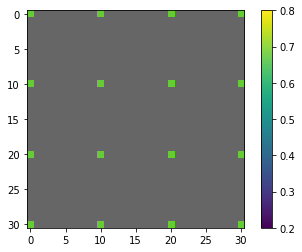

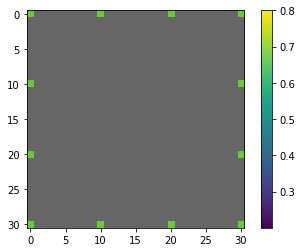

(1, 31, 31, 3)
(31, 31, 3)
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 31, 31, 3)         0         
_________________________________________________________________
lambda_1 (Lambda)            (None, 31, 31, 3)         0         
Total params: 0
Trainable params: 0
Non-trainable params: 0
_________________________________________________________________


In [6]:
from keras.models import Sequential

def box_kern(kernlen=[3,3]):
    """Returns a 2D Gaussian kernel array."""
    kernel = np.zeros(kernlen)
    value = (1/8) 
    kernel[...,0] =[value,0,0]
    kernel[...,1] =[0,value,0] 
    kernel[...,2] =[0,0,value] 
    kernel[kernel.shape[0]//2,kernel.shape[1]//2] = 0
    print(kernel.shape)
    return kernel

def kernel_init(shape):
    kernel = np.zeros(shape)
    return box_kern([shape[0], shape[1],shape[2],shape[3]]) 

def lin_interpol_lambda(x):
    median = Conv2D(3, [3,3], kernel_initializer=kernel_init, data_format='channels_last', padding="same", activation=None, use_bias=False,)(x)
    median.trainable = False
    #median_filter = K.tile(median_filter[np.newaxis,:, :, np.newaxis], [1, 1, 1, 1])
    mask = get_mask(K.int_shape(x)[1:])
    mask[0,...] = 0
    mask[:,0] = 0
    mask[:,-1] = 0
    mask[-1,:] = 0
    
    return (mask[np.newaxis,:, :,:] * median + (1-mask[np.newaxis,:, :,:])*x)

test_input_shape = (31,31)

def get_testnet(do=0, activation=ReLU, weights=None):
    #Encoder
    inputs2 = Input(test_input_shape+(3,))
    
    lin_interpol_layer = Lambda(lin_interpol_lambda)
    output = lin_interpol_layer(inputs2)
    
    model = Model(inputs=[inputs2], outputs=[output])
    model.compile(optimizer='rmsprop',
              loss='categorical_crossentropy',
              metrics=['accuracy'])
    return model


# To apply existing filter, we use predict with no training
model = get_testnet()

mask = np.full(test_input_shape+(3,), 0.4)
mask[::10, ::10,:] = [0.4,0.8,0.2]
#mask[5::10, 5::10,:] = [0.2,0.8,0.4]
    
input_img = mask[np.newaxis,:,:]#next(train_generator)[0]



out = model.predict(input_img)
plt.imshow(input_img[0], interpolation='none')
plt.colorbar()
plt.show()
plt.imshow(out[0], interpolation='none')
plt.colorbar()
plt.show()
print(out.shape)
print(out[0].shape)
model.summary()
del model

## Create Network

In [7]:
  

def l1_ms_ssim_mix(y_true, y_pred):
    mae = losses.mean_absolute_error(y_true,y_pred)
    ms_ssim = 1- tf.reduce_mean(tf.image.ssim_multiscale(y_true, y_pred,1))
    alpha = 0.84  # no need for clipping, c1 and c2 make the denom non-zero
    #dssim = K.mean((1.0 - ms_ssim) / 2.0)
    return alpha * ms_ssim + (1-alpha)*mae


def generate_dualiso_clip_10_10_srgb(lin_img, clip_value=0.9):
    org_img = lin_img.copy()
    upper_img = (org_img)
    lower_img = (org_img).clip(0,clip_value)
    
    mask = np.zeros(org_img.shape)
    mask[::10, ::10] = 1
    
    combined_img_grid = mask * upper_img + (1-mask)*lower_img
    
    return combined_img_grid

def box_kern(kernlen=[3,3]):
    """Returns a 2D Gaussian kernel array."""
    kernel = np.zeros(kernlen)
    value = (1/8) 
    kernel[...,0] =[value,0,0]
    kernel[...,1] =[0,value,0] 
    kernel[...,2] =[0,0,value] 
    kernel[kernel.shape[0]//2,kernel.shape[1]//2] = 0
    print(kernel.shape)
    return kernel

def kernel_init(shape):
    kernel = np.zeros(shape)
    return box_kern([shape[0], shape[1],shape[2],shape[3]]) 

def lin_interpol_lambda(x):
    median = Conv2D(3, [3,3], kernel_initializer=kernel_init, data_format='channels_last', padding="same", activation=None, use_bias=False,)(x)
    median.trainable = False
    #median_filter = K.tile(median_filter[np.newaxis,:, :, np.newaxis], [1, 1, 1, 1])
    mask = get_mask(K.int_shape(x)[1:])
    mask[0,...] = 0
    mask[:,0] = 0
    mask[:,-1] = 0
    mask[-1,:] = 0
    
    return (mask[np.newaxis,:, :,:] * median + (1-mask[np.newaxis,:, :,:])*x)

smooth = 1.

In [8]:
# Final Network used in the paper
def get_unet_org(do=0, activation=ReLU, weights=None, input_shape=(1024,1024),lin_interpol=False):
    inputs = Input(input_shape+(3,))
    conv1 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(inputs)))
    conv1 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(conv1)))
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(pool1)))
    conv2 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(conv2)))
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(pool2)))
    conv3 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(conv3)))
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(pool3)))
    conv4 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(conv4)))
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Dropout(do)(activation()(Conv2D(512, (3, 3), padding='same')(pool4)))
    conv5 = Dropout(do)(activation()(Conv2D(512, (3, 3), padding='same')(conv5)))

    up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
    conv6 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(up6)))
    conv6 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(conv6)))

    up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
    conv7 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(up7)))
    conv7 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(conv7)))

    up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
    conv8 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(up8)))
    conv8 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(conv8)))

    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
    conv9 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(up9)))
    conv9 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(conv9)))
    conv10 = (Dropout(do)(Conv2D(3, (1, 1), activation='sigmoid')(conv9)))
    
    if lin_interpol:
        lin_interpol_layer = Lambda(lin_interpol_lambda)
    
        output = lin_interpol_layer(conv10)
    else:
        output = conv10
        
    model = Model(inputs=[inputs], outputs=[output])
    if weights:
        print("Loading Weights")
        model.load_weights(weights, by_name=True)
    
    model.compile(optimizer=Adam(lr=1e-4), loss=l1_ms_ssim_mix)

    return model

In [9]:
# Network without the skip connections used for comparison
def get_unet_org_wo_skip(do=0, activation=ReLU, weights=None, input_shape=(1024,1024)):
    inputs = Input(input_shape+(3,))
    conv1 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(inputs)))
    conv1 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(conv1)))
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(pool1)))
    conv2 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(conv2)))
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(pool2)))
    conv3 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(conv3)))
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(pool3)))
    conv4 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(conv4)))
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    conv5 = Dropout(do)(activation()(Conv2D(512, (3, 3), padding='same')(pool4)))
    conv5 = Dropout(do)(activation()(Conv2D(512, (3, 3), padding='same')(conv5)))

    up6 = activation()(Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5))
    conv6 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(up6)))
    conv6 = Dropout(do)(activation()(Conv2D(256, (3, 3), padding='same')(conv6)))

    up7 = activation()(Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6))
    conv7 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(up7)))
    conv7 = Dropout(do)(activation()(Conv2D(128, (3, 3), padding='same')(conv7)))

    up8 = activation()(Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7))
    conv8 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(up8)))
    conv8 = Dropout(do)(activation()(Conv2D(64, (3, 3), padding='same')(conv8)))

    up9 = activation()(Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8))
    conv9 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(up9)))
    conv9 = Dropout(do)(activation()(Conv2D(32, (3, 3), padding='same')(conv9)))
    conv10 = (Dropout(do)(Conv2D(3, (1, 1), activation='sigmoid')(conv9)))
    
    lin_interpol_layer = Lambda(lin_interpol_lambda)
    
    output = conv10#lin_interpol_layer(conv10)
    
    model = Model(inputs=[inputs], outputs=[output])
    if weights:
        print("Loading Weights")
        model.load_weights(weights, by_name=True)
    
    model.compile(optimizer=Adam(lr=1e-4), loss=l1_ms_ssim_mix)

    return model

In [10]:
def get_unet(do=0, activation=ReLU, weights=None):
    return get_unet_org(do=do, activation=activation, weights=weights, lin_interpol=False)
    #return get_unet_org_wo_skip(do=do, activation=activation, weights=weights)

In [11]:
# Create network and save to file
model = get_unet()
model_json = model.to_json()
with open("models/model_mixedloss.json", "w") as json_file:
    json_file.write(model_json)
print("Model saved as JSON")
model.summary()

Model saved as JSON
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 1024, 1024, 3 0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 1024, 1024, 3 896         input_2[0][0]                    
__________________________________________________________________________________________________
re_lu_1 (ReLU)                  (None, 1024, 1024, 3 0           conv2d_3[0][0]                   
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 1024, 1024, 3 0           re_lu_1[0][0]                    
_________________________________________________________________________________________

In [12]:
#get_unet().summary()

## Create training data generators and augmentation

In [2]:
# Function to generate the trainingsdata with our proposed grid
def generate_dualiso_clip_10_10_srgb(lin_img, clip_value=0.5 , rotate_mask= False):
    org_img = lin_img.copy()
    upper_img = (org_img)
    lower_img = (org_img).clip(0,clip_value)
    
    mask = get_mask(org_img.shape,rotate_45=rotate_mask)
    
    combined_img_grid = mask * upper_img + (1-mask)*lower_img
    
    return combined_img_grid

In [3]:
# Function to generate the baseline images
def generate_clip_10_10_srgb(lin_img, clip_value=0.5):
    org_img = lin_img.copy()
    lower_img = (org_img).clip(0,clip_value)
    
    return lower_img

In [15]:
# Create Datagenerator for training
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
def clip_10x10(image):
        return generate_dualiso_clip_10_10_srgb(image, clip_value=(int(0.5*255)),rotate_mask=True)

#data_dir="/media/leon/DataDrive/data/hdr_dataset_google/"
data_dir="/mnt/data-drive/data/hdr_dataset_google/"
batch_size = 2
val_split = 0.1


data_gen_args_input = dict(rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=[0.8,1],
            rescale=1./255,
            horizontal_flip=True,
            data_format = "channels_last",
            fill_mode='reflect',
            validation_split=val_split)
data_gen_args_dualiso = dict(rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=[0.8,1],
            rescale=1./255,
            horizontal_flip=True,
            preprocessing_function = clip_10x10,
            data_format = "channels_last",
            fill_mode='reflect',
            validation_split=val_split)
image_datagen = ImageDataGenerator(**data_gen_args_input)
dualiso_datagen = ImageDataGenerator(**data_gen_args_dualiso)


# Fixed seed for comparable results
seed=1642
#seed = 162
#seed = np.random.randint(0,2912)
#image_datagen.fit(images, augment=True, seed=seed)
#mask_datagen.fit(masks, augment=True, seed=seed)

image_generator_train = image_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='training')

dualiso_generator_train = dualiso_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='training')

image_generator_val = image_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='validation')

dualiso_generator_val = dualiso_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='validation')

# combine generators into one which yields image and masks
train_generator = zip(dualiso_generator_train, image_generator_train)
val_generator = zip(dualiso_generator_val, image_generator_val)


Found 3276 images belonging to 2 classes.
Found 3276 images belonging to 2 classes.
Found 364 images belonging to 2 classes.
Found 364 images belonging to 2 classes.


# Training LE Grid network
    

In [ ]:
# we use bigger code size here for better quality
from keras import optimizers
from tqdm import tqdm_notebook
from datetime import datetime

timestamp = datetime.now().strftime('%d_%H%M%S')

dataset_len = 49578


#train_data = get_filelist(data_dir="../data/hdr_dataset_google/")
#val_data = get_filelist(data_dir="../data/test_256_aug_10x10/")
print("Starting Training with seed: " +str(seed))
checkpoint = ModelCheckpoint("weights/weights_dualiso_rot45_mixedloss_24062019.{epoch:02d}-{val_loss:.4f}.h5", monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_loss", mode="min", patience=5, verbose=1)
redonplat = ReduceLROnPlateau(monitor="val_loss", mode="min", patience=3, verbose=1)
callbacks_list = [ early, redonplat, checkpoint, ]

autoencoder = get_unet()
#autoencoder.summary()
#autoencoder.save("models/autoencoder_dualiso_lin_mixedloss_01062019")


history = autoencoder.fit_generator(train_generator, validation_data=val_generator, epochs=10, verbose=1,
                         callbacks=callbacks_list, steps_per_epoch= (3276*2)//batch_size,
                                  validation_steps=364//batch_size, use_multiprocessing=True, workers=16) 
#autoencoder

In [23]:
autoencoder.save("models/autoencoder_dualiso_rot45_mixedloss_24062019.h5")

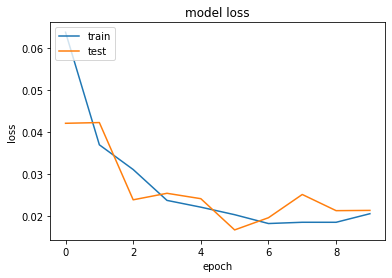

In [24]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [24]:
print(history.history)

{'val_loss': [0.041134017100045966, 0.03970394209846036, 0.024595154101377005, 0.025829850910947874, 0.023324615112249994, 0.01729952338775927, 0.018598125723016622, 0.025715604455179567, 0.021236583610976134, 0.02147006565848222, 0.021380445137005915], 'loss': [0.06487226144266252, 0.035657270922085614, 0.0299253716841124, 0.023443336081600114, 0.0220053773429512, 0.02037569253250015, 0.0183424972917689, 0.018629097330846774, 0.01857415567456673, 0.020615802990469934, 0.01982002200194042], 'lr': [1e-04, 1e-04, 1e-04, 1e-04, 1e-04, 1e-04, 1e-04, 1e-04, 1e-04, 1e-05, 1e-05]}


In [25]:
#autoencoder = get_unet()
#autoencoder.load_weights('weights.03-0.00.hdf5', by_name=True)
#autoencoder.save_weights('weights.presentation_jan.hdf5')

## Evaluate Trainings Result

In [26]:
dualiso, orgdata = next(val_generator)
denoising_mse = autoencoder.evaluate(dualiso, orgdata, verbose=0)

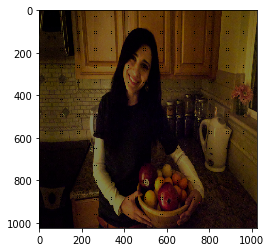

0.7943084836006165


In [27]:
intermediate = dualiso[0].copy()
intermediate = intermediate-get_mask(intermediate.shape)
intermediate = intermediate.clip(min=0)
plt.imshow(intermediate)
plt.show()
print(np.max(intermediate))

In [64]:
#print(denoising_mse)
#618
print(seed)

618


(2, 1024, 1024, 3)


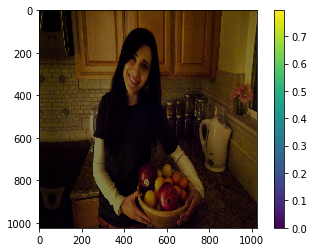

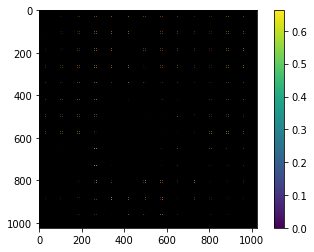

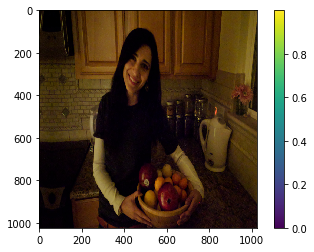

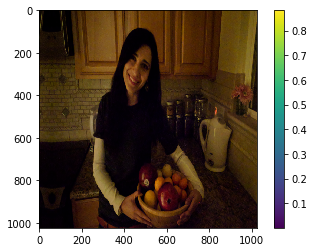

In [29]:
test_out = autoencoder.predict(dualiso)
print(test_out.shape)

mask = dualiso[0] >= 0.699
masked_dualiso =dualiso[0].copy() * get_mask(mask.shape)

plt.imshow(dualiso[0])
plt.colorbar()
plt.show()

plt.imshow(masked_dualiso)
plt.colorbar()
plt.show()

plt.imshow(orgdata[0])
plt.colorbar()
plt.show()

plt.imshow(test_out[0])
plt.colorbar()
plt.show()

# Training of baseline network

In [17]:
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
def clip_10x10(image):
        return generate_clip_10_10_srgb(image, clip_value=(int(0.5*255)))

#data_dir="/media/leon/DataDrive/data/hdr_dataset_google/"
data_dir="/mnt/data-drive/data/hdr_dataset_google/"
batch_size = 2
val_split = 0.1

#Probleme mask und bild synchron
data_gen_args_input = dict(rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=[0.8,1],
            rescale=1./255,
            horizontal_flip=True,
            data_format = "channels_last",
            fill_mode='reflect',
            validation_split=val_split)
data_gen_args_clipped = dict(rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=[0.8,1],
            rescale=1./255,
            horizontal_flip=True,
            preprocessing_function = clip_10x10,
            data_format = "channels_last",
            fill_mode='reflect',
            validation_split=val_split)
image_datagen = ImageDataGenerator(**data_gen_args_input)
clipped_datagen = ImageDataGenerator(**data_gen_args_clipped)

#seed = np.random.randint(0,2912)
seed = 1642
#image_datagen.fit(images, augment=True, seed=seed)
#mask_datagen.fit(masks, augment=True, seed=seed)

image_generator_train = image_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='training')

clipped_generator_train = clipped_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='training')

image_generator_val = image_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='validation')

clipped_generator_val = clipped_datagen.flow_from_directory(
    data_dir,
    batch_size=batch_size,
    target_size=input_shape,
    class_mode=None,
    seed=seed,
    subset='validation')

# combine generators into one which yields image and masks
train_generator = zip(clipped_generator_train, image_generator_train)
val_generator = zip(clipped_generator_val, image_generator_val)


Found 3276 images belonging to 2 classes.
Found 3276 images belonging to 2 classes.
Found 364 images belonging to 2 classes.
Found 364 images belonging to 2 classes.


Good Settings:
    Variance 4
    Epoch 4
    

In [ ]:
# we use bigger code size here for better quality
from keras import optimizers
from tqdm import tqdm_notebook



dataset_len = 49578


#train_data = get_filelist(data_dir="../data/hdr_dataset_google/")
#val_data = get_filelist(data_dir="../data/test_256_aug_10x10/")
#weights/weights_dualiso_hdmask_mixedloss.{epoch:02d}-{val_loss:.4f}.h5
checkpoint = ModelCheckpoint("weights/weights_clipped_mixedloss.{epoch:02d}-{val_loss:.2f}.h5", monitor='val_loss', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_loss", mode="min", patience=5, verbose=1)
redonplat = ReduceLROnPlateau(monitor="val_loss", mode="min", patience=3, verbose=1)
callbacks_list = [ early, redonplat, checkpoint]

autoencoder = get_unet()
#autoencoder.summary()


history = autoencoder.fit_generator(train_generator, validation_data=val_generator, epochs=10, verbose=1,
                         callbacks=callbacks_list, steps_per_epoch= (3276*2)//batch_size,
                                  validation_steps=364//batch_size, use_multiprocessing=True, workers=16)        

In [ ]:
autoencoder.save("models/autoencoder_clipped_mixedloss_02062019.h5")

In [ ]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
print(history.history)

## Evaluate Training results

In [ ]:
dualiso, orgdata = next(val_generator)
denoising_mse = autoencoder.evaluate(dualiso, orgdata, verbose=0)

In [ ]:
intermediate = dualiso[0].copy()
intermediate[::10, ::10] = 0
plt.imshow(intermediate)
plt.show()
print(np.max(intermediate))

In [ ]:
print(denoising_mse)
print(seed)

In [ ]:
test_out = autoencoder.predict(dualiso)
print(test_out.shape)

mask = dualiso[0] >= 0.699
masked_dualiso =dualiso[0].copy()
masked_dualiso[np.logical_not(mask)] = 0

plt.imshow(dualiso[0])
plt.colorbar()
plt.show()

plt.imshow(masked_dualiso)
plt.colorbar()
plt.show()

plt.imshow(orgdata[0])
plt.colorbar()
plt.show()

plt.imshow(test_out[0])
plt.colorbar()
plt.show()

# Compare Results

In [22]:
#dualiso_val = zip(dualiso_generator_val, image_generator_val)
dualiso_val = zip(dualiso_generator_val, image_generator_val)

In [24]:
from keras.models import load_model
from keras.models import model_from_json
from keras.utils import CustomObjectScope

# Function for loading intermiadte training weights, saved by ModelCheckpoint

json_file = open('models/model_mixedloss.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
autoencoder = model_from_json(loaded_model_json)

#weights/weights_dualiso_rot45_mixedloss.10-0.0146.h5
#weights/weights_dualiso_rot45_mixedloss.10-0.0146.h5
#weights/weights_dualiso_woskip_mixedloss.10-0.0731.h5

autoencoder.load_weights("weights/weights_dualiso_rot45_mixedloss_24062019.06-0.0166.h5")



# Function for loading final model, saved as model file

#autoencoder = autoencoder.compile(optimizer=Adam(lr=1e-4), loss=l1_ms_ssim_mix)
#with CustomObjectScope({'l1_ms_ssim_mix': l1_ms_ssim_mix}):
    #autoencoder = load_model("models/autoencoder_dualiso_rot45_mixedloss_12062019.h5")#get_unet(weights='weights/imp_steps/weights_dualiso_intermediate_28052019.hdf5')
#autoencoder.load_weights()

print("Loaded model from disk")

Loaded model from disk


In [25]:
#autoencoder.summary()
#get_unet().summary()

Original Images:
------------------------------------
Predicted Images:


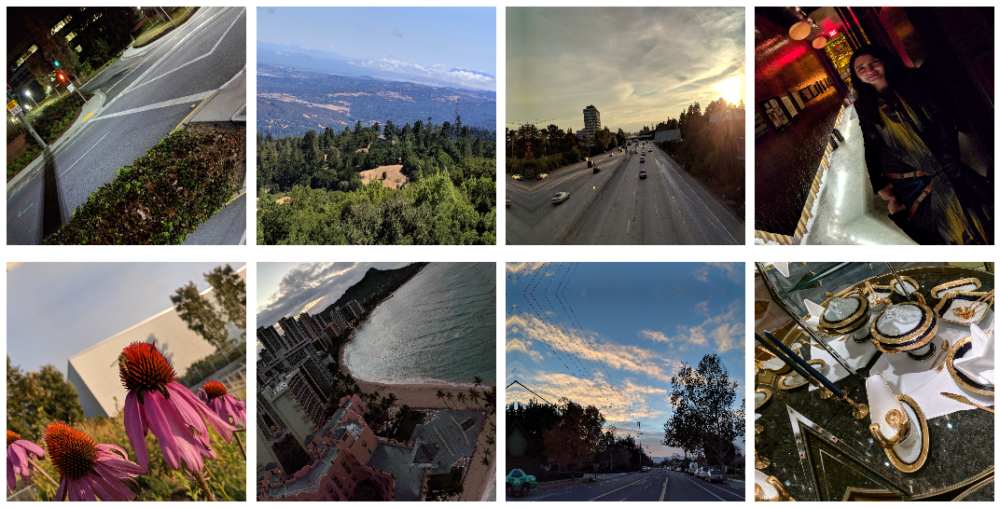

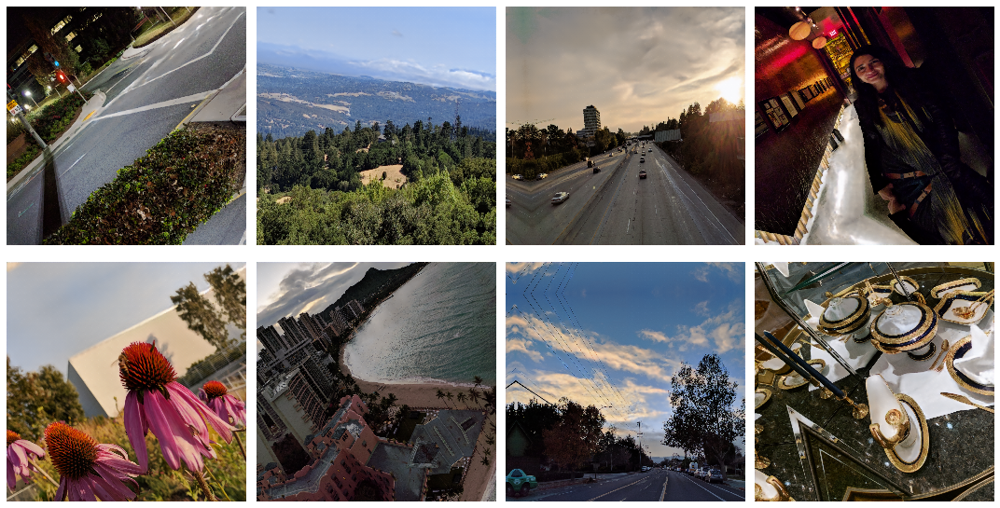

In [26]:
# Display predictions

predicted_data = []
org_data = []
net_input = []
for i in range(8):
    dualiso, orgimg = next(dualiso_val)
    predicted_data.append(autoencoder.predict(dualiso)[0])
    net_input.append(dualiso[0])
    org_data.append(orgimg[0])

print("Original Images:")
plot_output(org_data)
print(12*"---")
print("Predicted Images:")
plot_output(predicted_data)



Max Value over all Images shown: 0.49803921580314636


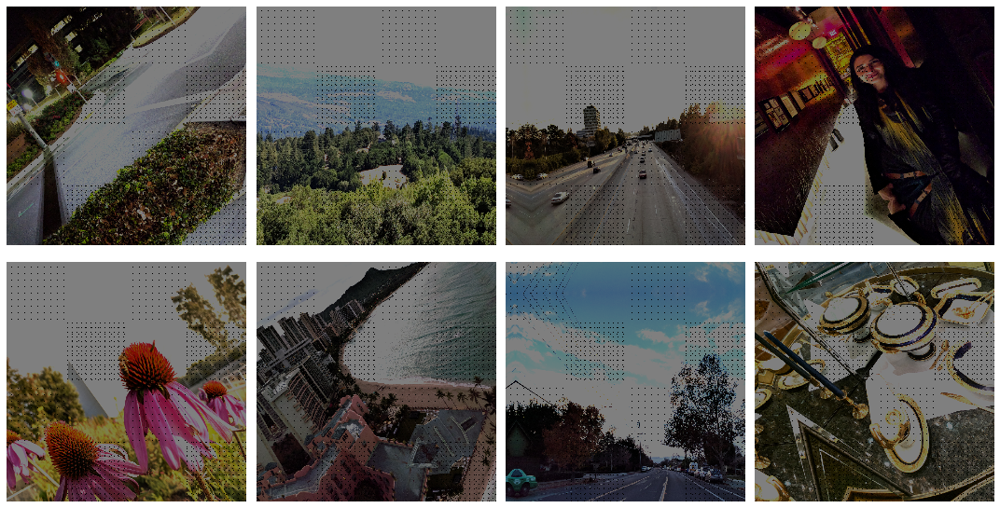

In [30]:
# Control max values

net_in_no_nd = net_input.copy()
for i in tqdm_notebook(range(len(net_in_no_nd[:]))):
    mask = np.array(get_mask((1024,1024),rotate_45=True), dtype=bool)
    net_in_no_nd[i][mask] = 0
    
print("Max Value over all Images shown: {0}".format(np.max(net_in_no_nd)))
plot_output(net_in_no_nd)

## Save predictions as image

In [42]:
# Generate Prediction, concat with original and network input and save to file

from skimage import img_as_ubyte
from tqdm import tqdm_notebook, tqdm

show_result = False
safe_result = True

for i in tqdm_notebook(range(364)):
    dualiso, orgimg = next(dualiso_val)
    dualiso = np.expand_dims(dualiso[0], axis=0)
    orgimg = orgimg[0]
    prediction = autoencoder.predict(dualiso)
    #predicted_data.append(prediction)
    #net_input.append(dualiso)
    #org_data.append(orgimg)

    delimiter = np.full((orgimg.shape[0],6,3),0.5)
    result = np.hstack((dualiso[0],delimiter,prediction[0],delimiter,orgimg))
    
    if show_result:
        figure = plt.gcf() # get current figure
        size = 2
        figure.set_size_inches(8*size, 6*size)

        plt.imshow(result)
        plt.show()
    if safe_result:
        imageio.imwrite("results/Comparison_Clip05_dualiso_rot45_mixedloss_ep6_25062019/img_test_{:04d}.jpg".format(i), img_as_ubyte(result), quality=100)

In [32]:
# Clear session before loading new model

K.clear_session()

In [ ]:
autoencoder = get_unet(weights='weights_clipped_intermediate_28052019.hdf5')
clipped_img, orgimg = next(clipped_val)
plt.imshow(autoencoder.predict(clipped_img)[0])

In [ ]:

predicted_data = []
for i in range(8):
    clipped_img, orgimg = next(clipped_val)
    predicted_data.append(autoencoder.predict(clipped_img)[0])
plot_output(predicted_data)

## Comparison PSNR

In [30]:
K.clear_session()

In [34]:
# Calculate psnr, ssim and mse for paper

import skimage
def calc_psnr_ssim_mse(output, target):
    psnr = skimage.measure.compare_psnr(target, output)
    ssim = skimage.measure.compare_ssim(target, output, multichannel=True)
    msssim = 0 #calc_msssim(target, output)
    mse = skimage.measure.compare_mse(target, output)
    
    return psnr, ssim, msssim, mse

In [36]:
from skimage import img_as_ubyte
from tqdm import tqdm_notebook, tqdm

import imageio
import numpy as np
import matplotlib.pyplot as plt
import os
os.environ["CUDA_VISIBLE_DEVICES"]="0"

psnr_data_dualiso = []
ssim_data_dualiso = []
mse_data_dualiso = []

for i in tqdm_notebook(range(182)):
    full_img = imageio.imread("results/_Comparison_Clip05_Clipped_mixedloss_04062019/img_test_{:04d}.jpg".format(i))
    full_img = full_img/255
    prediction = full_img.copy()
    prediction = prediction[:,1030:1030+1024]
    input_img = full_img.copy()
    input_img = input_img[:,0:1024]
    orgimg = full_img
    orgimg = orgimg[:,1036+1024:1036+2*1024]
        
    if False:
        plt.imshow(prediction)
        plt.show()
        #print(prediction.shape)
        plt.imshow(orgimg)
        plt.colorbar()
        plt.show()
        #print(orgimg.shape)

    delimiter = np.full((orgimg.shape[0],6,3),0.5)
    result = np.hstack((prediction,delimiter,orgimg))

    if False:
        figure = plt.gcf() # get current figure
        size = 2
        figure.set_size_inches(8*size, 6*size)

        plt.imshow(result)
        plt.show()


    #print("Computing video: %d" % i)
    psnr_np, ssim_np, msssim_np, mse = calc_psnr_ssim_mse(input_img, orgimg)
    #print(psnr_np)
    #print(ssim_np)
    #print(mse)
    #print(psnr_np)
    #print(ssim_np)
    psnr_data_dualiso.append(psnr_np)
    ssim_data_dualiso.append(ssim_np)
    #msssim_data_clipped(msssim_np)
    mse_data_dualiso.append(mse)
    


#plt.figure(figsize=(15,8))
#plt.plot(np.linspace(0,i,i+1),psnr_data_dualiso)
#print(psnr_data_dualiso)
print("PSNR: "+str(np.mean(psnr_data_dualiso)))
print("SSIM: "+str(np.mean(ssim_data_dualiso)))
#print(str(np.mean(msssim_data_dualiso)))
print("MSE: "+str(np.mean(mse_data_dualiso)))
          


PSNR: 19.33595494657208
SSIM: 0.8968660841704775
MSE: 0.01599382943777185


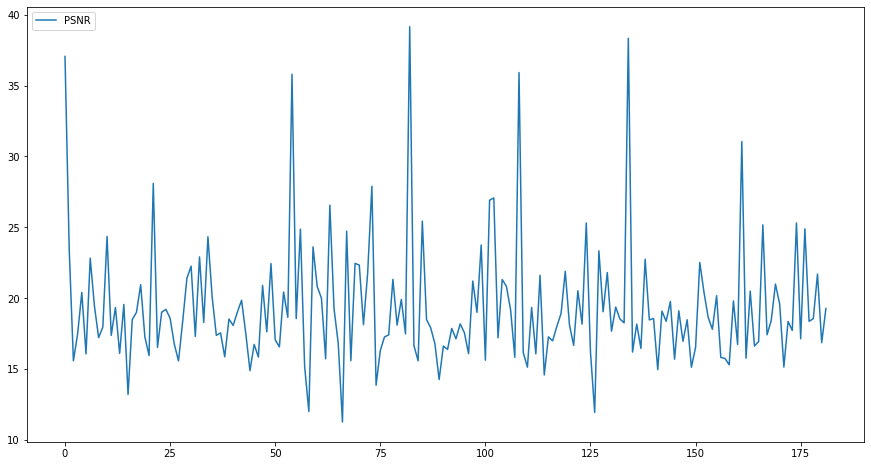

Mean PSNR: 19.33595494657208


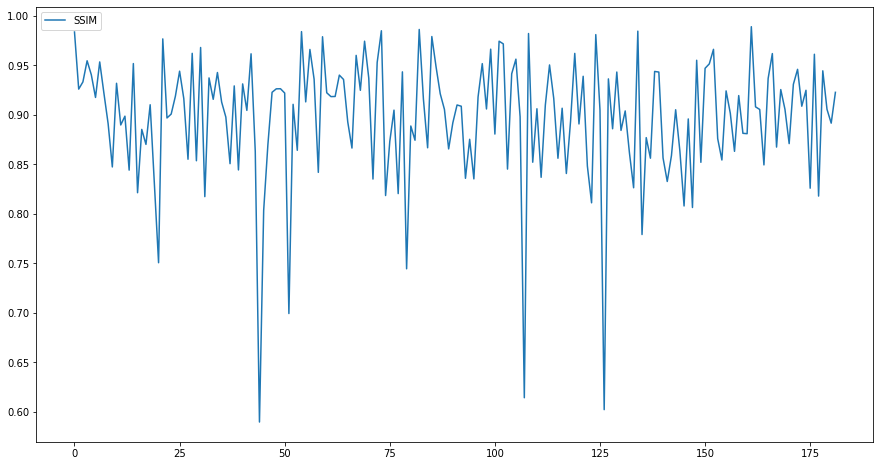

Mean SSIM: 0.8968660841704775


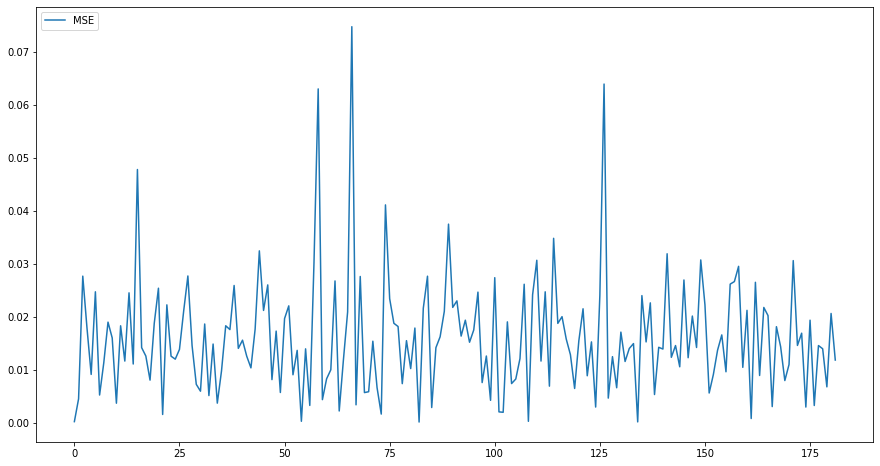

Mean MSE: 0.01599382943777185


In [42]:
plt.figure(figsize=(15,8))
plt.plot(np.linspace(0,i,i+1),psnr_data_dualiso)
plt.legend(['PSNR'], loc='upper left')
plt.show()
print("Mean PSNR: "+str(np.mean(psnr_data_dualiso)))


plt.figure(figsize=(15,8))
plt.plot(np.linspace(0,i,i+1),ssim_data_dualiso)
plt.legend(['SSIM'], loc='upper left')
plt.show()
print("Mean SSIM: "+str(np.mean(ssim_data_dualiso)))


plt.figure(figsize=(15,8))
plt.plot(np.linspace(0,i,i+1),mse_data_dualiso)
plt.legend(['MSE'], loc='upper left')
plt.show()
print("Mean MSE: "+str(np.mean(mse_data_dualiso)))

In [ ]:
##Create Images for Sublimental

from skimage import img_as_ubyte
from tqdm import tqdm_notebook, tqdm
import matplotlib
import imageio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import os
plt.rcParams.update({'font.size': 18})
def compare_to_ground_truth(path="results/_Comparison_Clip05_Clipped_mixedloss_04062019/",num=182, fig_size=(15,4)):
    for i in tqdm_notebook(range(num)):
        full_img = imageio.imread(path+"img_test_{:04d}.jpg".format(i))
        full_img = full_img/255
        prediction = full_img.copy()
        prediction = prediction[:,1030:1030+1024]
        
        dualiso = full_img.copy()
        dualiso = dualiso[:,0:1024]
        dualiso = generate_clip_10_10_srgb(dualiso,clip_value=0.5)
        
        dualiso_o_mask = full_img.copy()
        dualiso_o_mask = dualiso_o_mask[:,0:1024]
        
        orgimg = full_img
        orgimg = orgimg[:,1036+1024:1036+2*1024]
        
        if True:
            plt.figure(figsize=fig_size)
            plt.subplot(1,2,1)
            plt.imshow(dualiso)
            plt.xticks([])
            plt.yticks([])
            #plt.colorbar()
            
            plt.subplot(1,2,2)
            
            plt.hist(dualiso.ravel(), bins=256, range=(0.0, 1.0))
            #plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=len(dualiso.ravel())))
            plt.yscale('log', nonposy='clip')
            plt.xlabel('electronic values');
            plt.ylabel('pixel count');
            
            plt.tight_layout()
            plt.show()
            
            if False:
                plt.figure(figsize=fig_size)
                plt.subplot(1,2,1)
                plt.imshow(prediction)
                plt.colorbar()
                plt.subplot(1,2,2)
                plt.hist(prediction.ravel(), bins=256, range=(0.0, 1.0))
                #plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
                plt.yscale('log', nonposy='clip')
                plt.xlabel('electronic values');
                plt.ylabel('pixel count');
                plt.tight_layout()
                plt.show()
            
            plt.figure(figsize=fig_size)
            plt.subplot(1,2,1)
            plt.imshow(orgimg)
            plt.xticks([])
            plt.yticks([])
            #plt.colorbar()
            plt.subplot(1,2,2)
            plt.hist(orgimg.ravel(), bins=256, range=(0.0, 1.0))
            plt.yscale('log', nonposy='clip')
            plt.xlabel('electronic values');
            plt.ylabel('pixel count');
            plt.tight_layout()
            plt.show()

        delimiter = np.full((orgimg.shape[0],6,3),0.5)
        result = np.hstack((prediction,delimiter,orgimg))

        if False:
            figure = plt.gcf() # get current figure
            size = 2
            figure.set_size_inches(8*size, 6*size)

            plt.imshow(result)
            plt.show()


        
#compare_to_ground_truth()
          

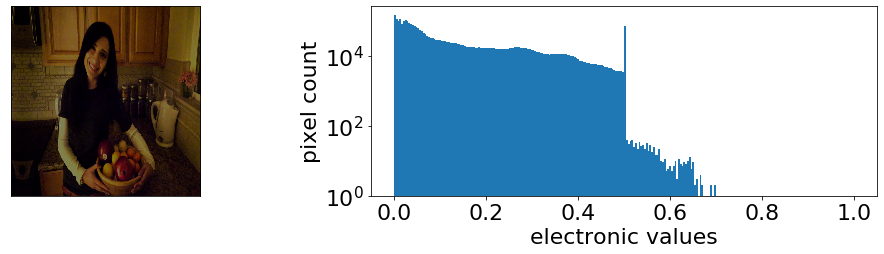

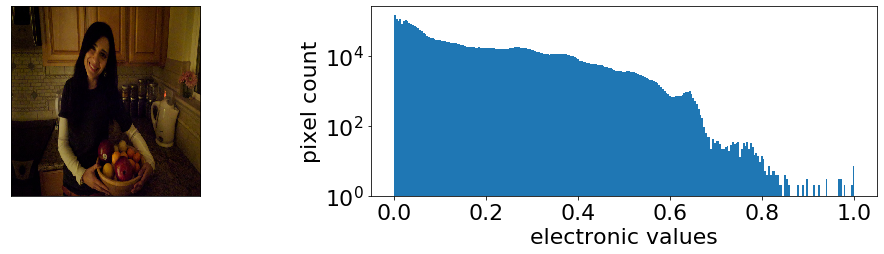

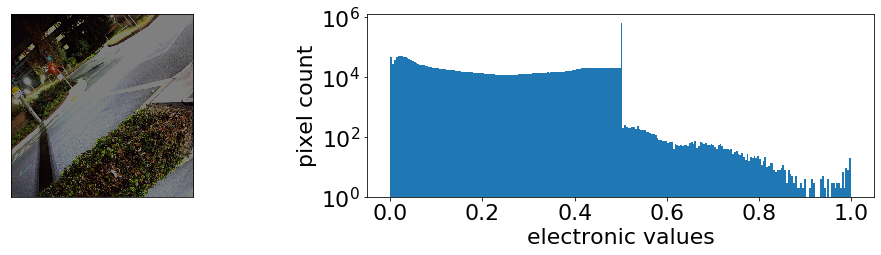

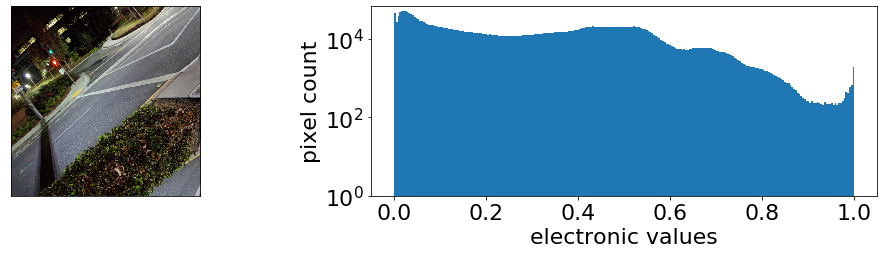

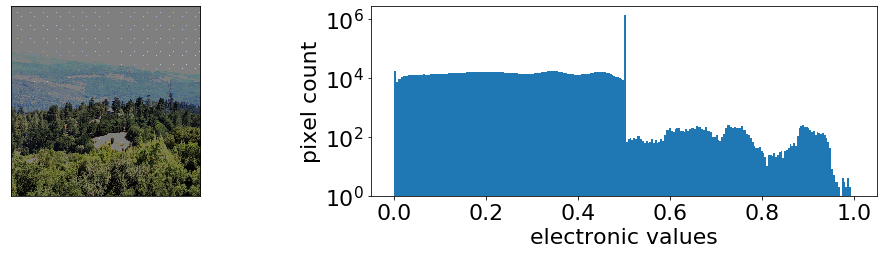

...

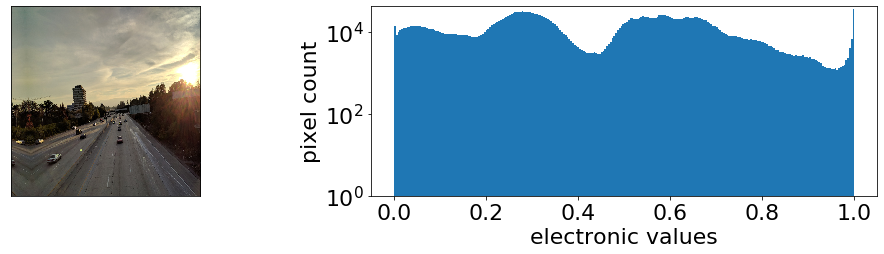

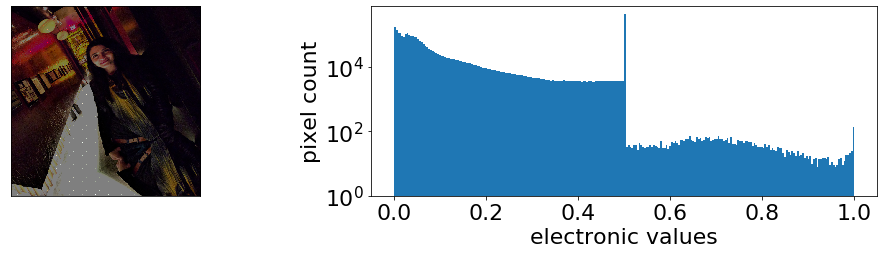

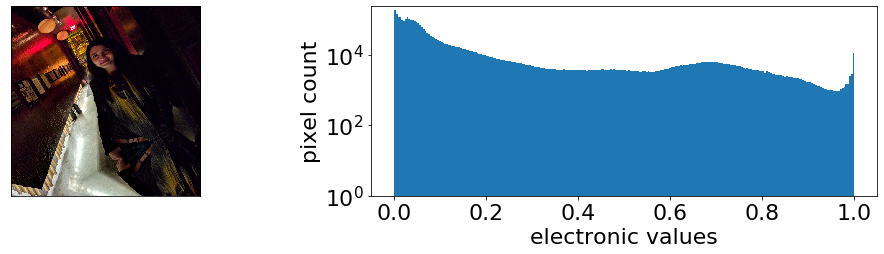

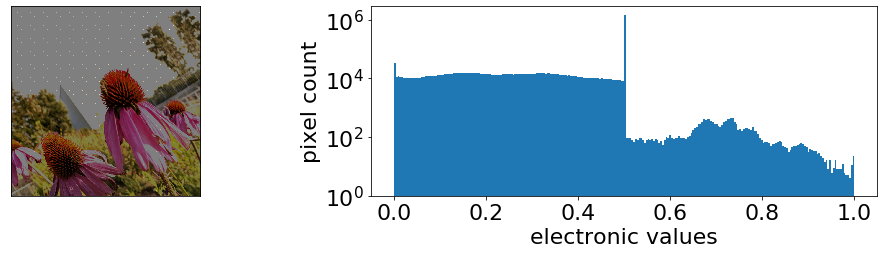

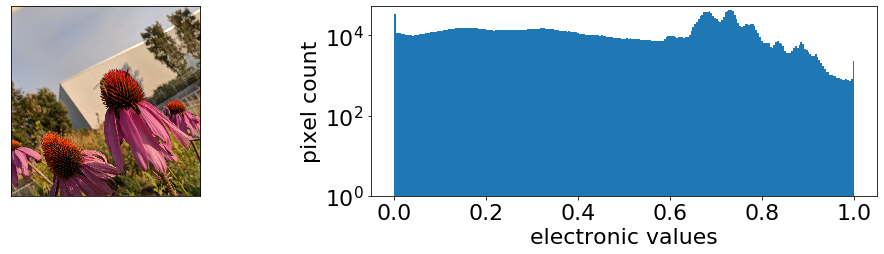

In [16]:
from skimage import img_as_ubyte
from tqdm import tqdm_notebook, tqdm
import matplotlib
import imageio
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import os
plt.rcParams.update({'font.size': 22})

                                        #_Comparison_Clip05_Clipped_mixedloss_04062019
def compare_to_ground_truth(path="results/Comparison_Clip05_dualiso_rot45_mixedloss_25062019/",num=6, fig_size=(15,4)):
    for i in tqdm_notebook(range(num)):
        full_img = imageio.imread(path+"img_test_{:04d}.jpg".format(i))
        full_img = full_img/255
        prediction = full_img.copy()
        prediction = prediction[:,1030:1030+1024]
        
        dualiso = full_img.copy()
        dualiso = dualiso[:,0:1024]
        
        
        dualiso_o_mask = full_img.copy()
        dualiso_o_mask = dualiso_o_mask[:,0:1024]
        
        orgimg = full_img
        orgimg = orgimg[:,1036+1024:1036+2*1024]
        
        dualiso = generate_dualiso_clip_10_10_srgb(orgimg,clip_value=0.5,rotate_mask=True)
        
        if True:
            plt.figure(figsize=fig_size)
            plt.subplot(1,2,1)
            plt.imshow(dualiso)
            plt.xticks([])
            plt.yticks([])
            #plt.colorbar()
            
            plt.subplot(1,2,2)
            
            plt.hist(dualiso.ravel(), bins=256, range=(0.0, 1.0))
            #plt.gca().yaxis.set_major_formatter(PercentFormatter(xmax=len(dualiso.ravel())))
            plt.yscale('log', nonposy='clip')
            plt.ylim(ymin=(1))
            
            plt.xlabel('electronic values');
            plt.ylabel('pixel count');
            
            plt.tight_layout()
            plt.show()
            
            if False:
                plt.figure(figsize=fig_size)
                plt.subplot(1,2,1)
                plt.imshow(prediction)
                plt.colorbar()
                plt.subplot(1,2,2)
                plt.hist(prediction.ravel(), bins=256, range=(0.0, 1.0))
                #plt.gca().yaxis.set_major_formatter(PercentFormatter(1))
                plt.yscale('log', nonposy='clip')
                plt.xlabel('electronic values');
                plt.ylabel('pixel count');
                plt.tight_layout()
                plt.show()
            
            plt.figure(figsize=fig_size)
            plt.subplot(1,2,1)
            plt.imshow(orgimg)
            plt.xticks([])
            plt.yticks([])
            #plt.colorbar()
            plt.subplot(1,2,2)
            plt.hist(orgimg.ravel(), bins=256, range=(0.0, 1.0))
            plt.yscale('log', nonposy='clip')
            plt.ylim(ymin=(1))
            plt.xlabel('electronic values');
            plt.ylabel('pixel count');
            plt.tight_layout()
            plt.show()

        delimiter = np.full((orgimg.shape[0],6,3),0.5)
        result = np.hstack((prediction,delimiter,orgimg))

        if False:
            figure = plt.gcf() # get current figure
            size = 2
            figure.set_size_inches(8*size, 6*size)

            plt.imshow(result)
            plt.show()


        
compare_to_ground_truth()
          

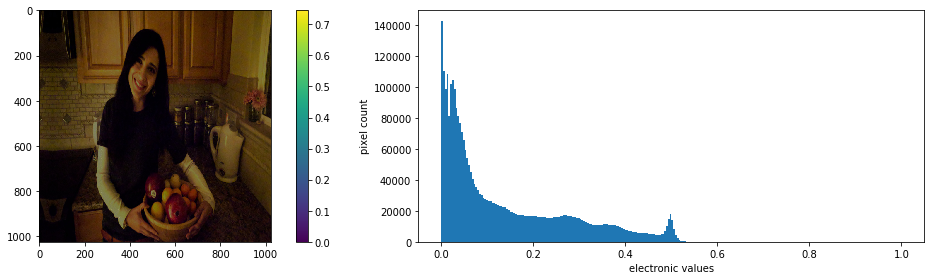

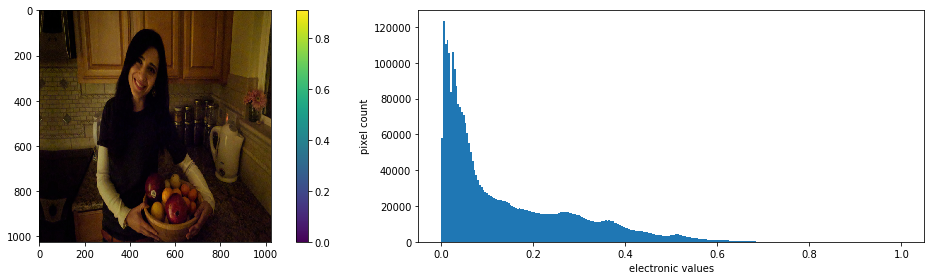

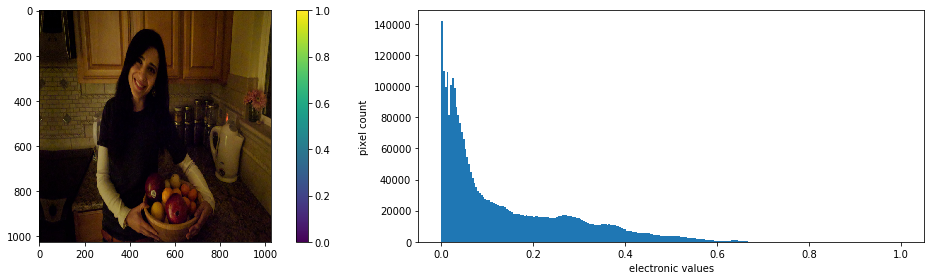

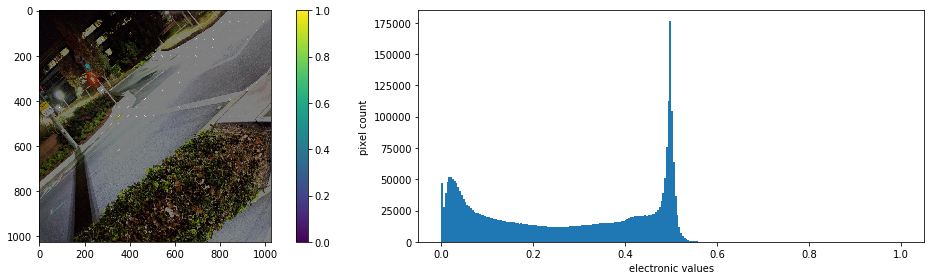

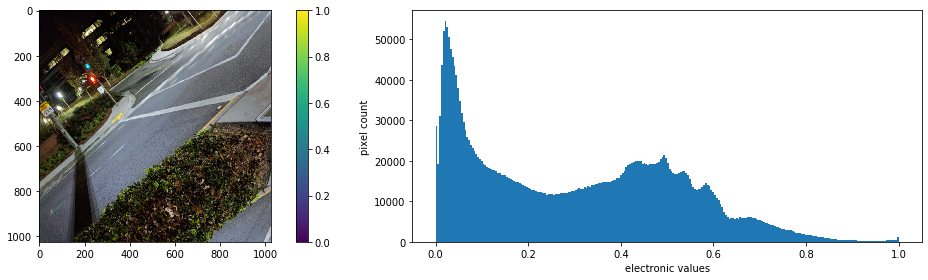

...

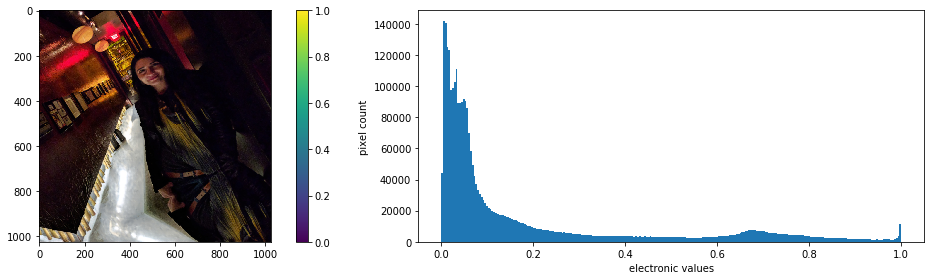

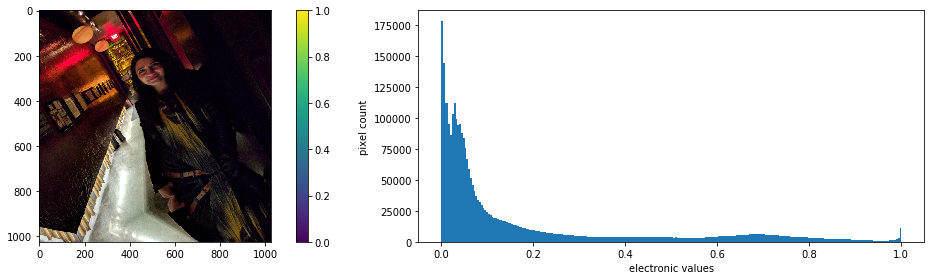

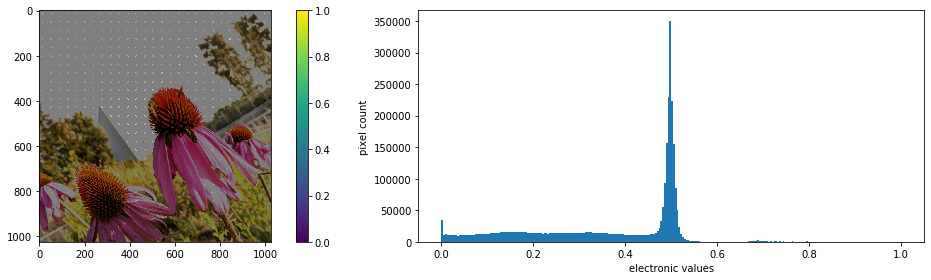

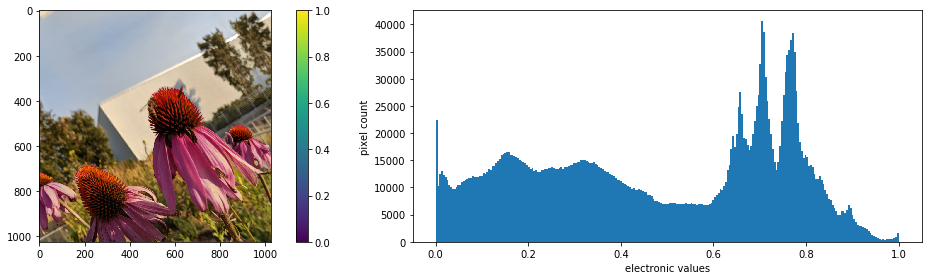

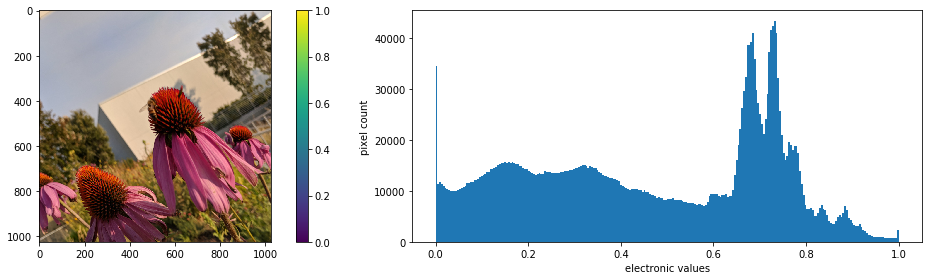

In [62]:
compare_to_ground_truth(path="results/Comparison_Clip05_hdmask_mixedloss_02062019/")